<a href="https://colab.research.google.com/github/mounikamarreddy/ArgumentConvincingnessAssignment/blob/main/FineTuneBERT_ArgumentConvincingness.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notes

## Introduction

### History

2018 was a breakthrough year in NLP. Transfer learning, particularly models like Allen AI's ELMO, OpenAI's Open-GPT, and Google's BERT allowed researchers to smash multiple benchmarks with minimal task-specific fine-tuning and provided the rest of the NLP community with pretrained models that could easily (with less data and less compute time) be fine-tuned and implemented to produce state of the art results. 

### What is BERT?

BERT (Bidirectional Encoder Representations from Transformers), released in late 2018, is the model I will use in this assignment that provide readers with a better understanding of and practical guidance for using transfer learning models in NLP. BERT is a method of pretraining language representations that was used to create models that NLP practicioners can then download and use for free. One can either use these models to extract high quality language features from their text data, or one can fine-tune these models on a specific task (classification, entity recognition, question answering, etc.) with their own data to produce state of the art predictions.

### What Can BERT Do For Me?

This notebook will explain how I modify and fine-tune BERT to create a powerful NLP model that quickly gives the state of the art results with argument convincingness dataset. 

### Why Fine-Tuning Rather Than Building My Own Model ?

In this notebook, I am using BERT to train a multi class (three classes: C5, C6, C7) text classifier. Specifically, I will take the pre-trained BERT model, add an untrained layer of neurons on the end, and train the new model for the given classification task. Why do this rather than train a specific deep learning model (a CNN, BiLSTM, etc.) that is well suited for the specific NLP task I need? 

#### Easy Training

First, the pre-trained BERT model weights already encode a lot of information about our language. As a result, it takes much less time to train our fine-tuned model - it is as if we have already trained the bottom layers of our network extensively and only need to gently tune them while using their output as features for our classification task. In fact, the authors recommend only 2-4 epochs of training for fine-tuning BERT on a specific NLP task (compared to the hundreds of GPU hours needed to train the original BERT model or a LSTM from scratch!). 

#### Less Data

In addition and perhaps just as important, because of the pre-trained weights this method allows us to fine-tune our task on a much smaller dataset than would be required in a model that is built from scratch. A major drawback of NLP models built from scratch is that we often need a prohibitively large dataset in order to train our network to reasonable accuracy, meaning a lot of time and energy had to be put into dataset creation. By fine-tuning BERT, we are now able to get away with training a model to good performance on a much smaller amount of training data.

#### Good Results

Second, this simple fine-tuning procedure (typically adding one fully-connected layer on top of BERT and training for a few epochs) was shown to achieve state of the art results with minimal task-specific adjustments for a wide variety of tasks: classification, language inference, semantic similarity, question answering, etc. Rather than implementing custom and sometimes-obscure architetures shown to work well on a specific task, simply fine-tuning BERT is shown to be a better (or at least equal) alternative.

#### A Shift in NLP

This shift to transfer learning parallels the same shift that took place in computer vision a few years ago. Creating a good deep learning network for computer vision tasks can take millions of parameters and be very expensive to train. Researchers discovered that deep networks learn hierarchical feature representations (simple features like edges at the lowest layers with gradually more complex features at higher layers). Rather than training a new network from scratch each time, the lower layers of a trained network with generalized image features could be copied and transfered for use in another network with a different task. It soon became common practice to download a pre-trained deep network and quickly retrain it for the new task or add additional layers on top - vastly preferable to the expensive process of training a network from scratch. For many, the introduction of deep pre-trained language models in 2018 (ELMO, BERT, ULMFIT, Open-GPT, etc.) signals the same shift to transfer learning in NLP that computer vision saw.

Let's get started with Argument Convincingness!

In this notebook, we build a fine tuned BERT model to perform Argument Convincingness task. Given a pair of arguments we need to classify them as one of the three classess (C5, C6, and C7).

In [ ]:
!pip install transformers
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 93.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 112.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 22.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertConfig
from transformers import AdamW, BertForSequenceClassification
from tqdm import tqdm, trange
import pandas as pd
import io
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In order for torch to use the GPU, we need to identify and specify the GPU as the device. Later, in our training loop, we will load data onto the device. 

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

'Tesla T4'

## Loading the Dataset

The dataset (train.csv) is uploaded in the github link:
https://github.com/mounikamarreddy/ArgumentConvincingnessAssignment 

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving train.csv to train.csv


I am using the argument convincingness dataset. It's a set of arguments labeled as C5, C6, and C7.

In [ ]:
df = pd.read_csv('train.csv',error_bad_lines=False, sep='\t')

In [ ]:
df.head()

,Unnamed: 0,Unnamed: 0.1,pair ID,Labels,Argument 1,Argument 2
0,1,1,43483_13275,o5,The government has no place to tell a woman wh...,for everyone who is talking about RAPE in this...
1,2,2,13276_13275,o7,The government has no place to tell a woman wh...,"we did not create the baby, we are not the one..."
2,3,3,13269_59260,o7,Is personhood absolute or is it predicated upo...,when people condemned consensual-cannibalism i...
3,6,6,13277_54474,o7,A growing embryo is considered human with the ...,"the one whom bestows life, is the one whom bes..."
4,7,7,76937_13263,o7,I choose life. Keeping the law pro-choice is a...,"Not to be glib, but are you stating that we sh..."


In [ ]:
df_train = df[['Labels','Argument 1', 'Argument 2']]
print(df_train.shape)

(3726, 3)


**Column 1**:	Labels: C5, C6, and C7.

**Column 2**:	the Argument1 sentence.

**Column 3**:	the Argument2 sentence.

In [ ]:
df_train['Labels'].value_counts()

o7    1657
o6    1209
o5     860
Name: Labels, dtype: int64

In [ ]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
encoder.fit(df_train['Labels'])
df_train['gold_label_numeric'] = encoder.transform(df_train['Labels'])

<ipython-input-11-a70fdfca2cf9>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['gold_label_numeric'] = encoder.transform(df_train['Labels'])


In [ ]:
df_train.head()

,Labels,Argument 1,Argument 2,gold_label_numeric
0,o5,The government has no place to tell a woman wh...,for everyone who is talking about RAPE in this...,0
1,o7,The government has no place to tell a woman wh...,"we did not create the baby, we are not the one...",2
2,o7,Is personhood absolute or is it predicated upo...,when people condemned consensual-cannibalism i...,2
3,o7,A growing embryo is considered human with the ...,"the one whom bestows life, is the one whom bes...",2
4,o7,I choose life. Keeping the law pro-choice is a...,"Not to be glib, but are you stating that we sh...",2


In [ ]:
# Creating sentence and label lists
sentences1 = df_train['Argument 1'].values
sentences2 = df_train['Argument 2'].values

# We need to add special tokens at the beginning ([CLS]), between sentences and end of each sentences ([SEP]) for BERT to work properly
sentences = ["[CLS] " + str(sentences1[i]) + " [SEP] " + str(sentences2[i]) + " [SEP]" for i in np.arange(df_train.shape[0])]
labels = df_train['gold_label_numeric'].values

## Inputs

Next, import the BERT tokenizer, used to convert our text into tokens that correspond to BERT's vocabulary.

In [ ]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

tokenized_texts = [tokenizer.tokenize(sent) for sent in sentences]
print(sentences[0])
print ("Tokenize the both sentences:")
print (tokenized_texts[0])

[CLS] The government has no place to tell a woman what she can do with her own body, ever. <br/> The government DOES have that right. <br/> 1) a woman cannot legally prostitute herself in many states <br/> 2) a woman cannot take illicit drugs into her own body <br/> 3) a woman cannot use her body to murder others <br/> 4) a woman cannot use her body to steal <br/> 5) a woman cannot display her naked body in public <br/> there are many others. Men can also not do these things. <br/> The government tells us what to do with our bodies ALL THE TIME. This is no different. [SEP] for everyone who is talking about RAPE in this subject let me ask you one thing!!!! if you got in a huge fight with someone and ended up breaking your hand or arm... would you cut it off just because it would REMIND you of that expirience??? <br/> if your actualy SANE you would say no and if you say yes you need to see a Physiatrist!!!! [SEP]
Tokenize the both sentences:
['[CLS]', 'the', 'government', 'has', 'no', 'p

BERT requires specifically formatted inputs. For each tokenized input sentence, we need to create:

- **input ids**: a sequence of integers identifying each input token to its index number in the BERT tokenizer vocabulary
- **segment mask**: (optional) a sequence of 1s and 0s used to identify whether the input is one sentence or two sentences long. For one sentence inputs, this is simply a sequence of 0s. For two sentence inputs, there is a 0 for each token of the first sentence, followed by a 1 for each token of the second sentence
- **attention mask**: (optional) a sequence of 1s and 0s, with 1s for all input tokens and 0s for all padding tokens (we'll detail this in the next paragraph)
- **labels**: a single value of 1 or 0 or 2. In our task 0 means "C5" , 1 means "C6", and 2 means "C7"

Although we can have variable length input sentences, BERT does requires our input arrays to be the same size. We address this by first choosing a maximum sentence length, and then padding and truncating our inputs until every input sequence is of the same length. 

To "pad" our inputs in this context means that if a sentence is shorter than the maximum sentence length, we simply add 0s to the end of the sequence until it is the maximum sentence length. 

If a sentence is longer than the maximum sentence length, then we simply truncate the end of the sequence, discarding anything that does not fit into our maximum sentence length.

We pad and truncate our sequences so that they all become of length MAX_LEN ("post" indicates that we want to pad and truncate at the end of the sequence, as opposed to the beginning) `pad_sequences` is a utility function that we're borrowing from Keras. It simply handles the truncating and padding of Python lists.

In [ ]:
# Set the maximum sequence length. 
# In the original paper, the authors used a length of 512.
# I used 256 for this assignment
MAX_LEN = 256

In [ ]:
# Use the BERT tokenizer to convert the tokens to their index numbers in the BERT vocabulary
input_ids = [tokenizer.convert_tokens_to_ids(x) for x in tokenized_texts]
print(len(input_ids[0]))

241


In [ ]:
# Pad our input tokens
input_ids = pad_sequences(input_ids, maxlen=MAX_LEN, dtype="long", truncating="post", padding="post")
print(len(input_ids[0]))

256


In [ ]:
# Create attention masks
attention_masks = []

# Create a mask of 1s for each token followed by 0s for padding
for seq in input_ids:
  seq_mask = [float(i>0) for i in seq]
  attention_masks.append(seq_mask)

In [ ]:
# create token_types or segmentation masks
encoded_dict = []
for i in np.arange(df_train.shape[0]):
  input_ids1 = tokenizer(sentences1[i], sentences2[i])
  input_ids1 = pad_sequences(np.array(input_ids1['token_type_ids']).reshape(1,len(input_ids1['token_type_ids'])), maxlen=MAX_LEN, dtype="long", truncating="post", padding="post")
  encoded_dict.append(input_ids1)

In [ ]:
# Use train_test_split to split our data into train, dev and test sets for training, validation and testing

train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels, 
                                                            random_state=2020, test_size=0.3)
dev_inputs, test_inputs, dev_labels, test_labels = train_test_split(validation_inputs, validation_labels, 
                                                            random_state=2020, test_size=0.2)
train_masks, validation_masks, _, _ = train_test_split(attention_masks, input_ids,
                                             random_state=2020, test_size=0.3)
dev_masks, test_masks, _, _ = train_test_split(validation_masks, validation_inputs, 
                                                            random_state=2020, test_size=0.2)
train_seg_masks, validation_seg_masks, _, _ = train_test_split(encoded_dict, input_ids,
                                             random_state=2020, test_size=0.3)
dev_seg_masks, test_seg_masks, _, _ = train_test_split(validation_seg_masks, validation_inputs, 
                                                            random_state=2020, test_size=0.2)

In [ ]:
# Convert all of our train, dev, and test data into torch tensors, the required datatype for our model

train_inputs = torch.tensor(train_inputs)
dev_inputs = torch.tensor(dev_inputs)
test_inputs = torch.tensor(test_inputs)
train_labels = torch.tensor(train_labels)
dev_labels = torch.tensor(dev_labels)
test_labels = torch.tensor(test_labels)
train_masks = torch.tensor(train_masks)
dev_masks = torch.tensor(dev_masks)
test_masks = torch.tensor(test_masks)
train_seg_masks = torch.tensor(np.array(train_seg_masks).reshape(np.array(train_seg_masks).shape[0],np.array(train_seg_masks).shape[2]))
dev_seg_masks = torch.tensor(np.array(dev_seg_masks).reshape(np.array(dev_seg_masks).shape[0],np.array(dev_seg_masks).shape[2]))
test_seg_masks = torch.tensor(np.array(test_seg_masks).reshape(np.array(test_seg_masks).shape[0],np.array(test_seg_masks).shape[2]))

In [ ]:
# Select a batch size for training. For fine-tuning BERT on a specific task, the authors recommend a batch size of 16 or 32.
# For this assignment, the batch size is considered as 8.
batch_size = 8

# Create an iterator of our data with torch DataLoader. This helps save on memory during training because, unlike a for loop, 
# with an iterator the entire dataset does not need to be loaded into memory

train_data = TensorDataset(train_inputs, train_masks, train_seg_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

dev_data = TensorDataset(dev_inputs, dev_masks, dev_seg_masks,  dev_labels)
dev_sampler = SequentialSampler(dev_data)
dev_dataloader = DataLoader(dev_data, sampler=dev_sampler, batch_size=batch_size)

test_data = TensorDataset(test_inputs, test_masks, test_seg_masks,  test_labels)
test_sampler = SequentialSampler(test_data)
test_dataloader = DataLoader(test_data, sampler=test_sampler, batch_size=batch_size)


## Train Model

Now that our input data is properly formatted, it's time to fine tune the BERT model. 

For this task, I first want to modify the pre-trained BERT model to give outputs for classification, and then I want to continue training the model on the argument convincingness dataset until that the entire model, end-to-end, is well-suited for the task. Thankfully, the huggingface pytorch implementation includes a set of interfaces designed for a variety of NLP tasks. Though these interfaces are all built on top of a trained BERT model, each has different top layers and output types designed to accomodate their specific NLP task.  

We'll load [BertForSequenceClassification](https://github.com/huggingface/pytorch-pretrained-BERT/blob/master/pytorch_pretrained_bert/modeling.py#L1129). This is the normal BERT model with an added single linear layer on top for classification that I will use as a sentence classifier. As I feed input data, the entire pre-trained BERT model and the additional untrained classification layer is trained on our specific task. 

### Structure of Fine-Tuning Model

As I have showed beforehand, the first token of every sequence is the special classification token ([CLS]). Unlike the hidden state vector corresponding to a normal word token, the hidden state corresponding to this special token is designated by the authors of BERT as an aggregate representation of the whole sentence used for classification tasks. As such, when we feed in an input sentence to our model during training, the output is the length 768 hidden state vector corresponding to this token. The additional layer that I have added on top consists of untrained linear neurons of size [hidden_state, number_of_labels], so [768,3], meaning that the output of BERT plus our classification layer is a vector of two numbers representing the "score" for "C5/C6/C7" that are then fed into cross-entropy loss.



### The Fine-Tuning Process

Because the pre-trained BERT layers already encode a lot of information about the language, training the classifier is relatively inexpensive. Rather than training every layer in a large model from scratch, it's as if we have already trained the bottom layers 95% of where they need to be, and only really need to train the top layer, with a bit of tweaking going on in the lower levels to accomodate our task.

Sometimes practicioners will opt to "freeze" certain layers when fine-tuning, or to apply different learning rates, apply diminishing learning rates, etc. all in an effort to preserve the good quality weights in the network and speed up training (often considerably). In fact, recent research on BERT specifically has demonstrated that freezing the majority of the weights results in only minimal accuracy declines, but there are exceptions and broader rules of transfer learning that should also be considered. For example, if your task and fine-tuning dataset is very different from the dataset used to train the transfer learning model, freezing the weights may not be a good idea. 



OK, let's load BERT! There are a few different pre-trained BERT models available. "bert-base-uncased" means the version that has only lowercase letters ("uncased") and is the smaller version of the two ("base" vs "large").

In [ ]:
# Load BertForSequenceClassification, the pretrained BERT model with a single linear classification layer on top. 

model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=3, output_hidden_states=True)
model.cuda()

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

Now that we have our model loaded we need to grab the training hyperparameters from within the stored model.

For the purposes of fine-tuning, the authors recommend the following hyperparameter ranges:
- Batch size: 16, 32 (for this assignment I used 8 as my batch size)
- Learning rate (Adam): 5e-5, 3e-5, 2e-5
- Number of epochs: 2, 3, 4

In [ ]:
param_optimizer = list(model.named_parameters())
no_decay = ['bias', 'gamma', 'beta']
optimizer_grouped_parameters = [
    {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)],
     'weight_decay_rate': 0.01},
    {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)],
     'weight_decay_rate': 0.0}
]

In [ ]:
# This variable contains all of the hyperparemeter information our training loop needs
optimizer = AdamW(optimizer_grouped_parameters,
                     lr=2e-5)

/usr/local/lib/python3.8/dist-packages/transformers/optimization.py:306: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Below is the training loop. There's a lot going on, but fundamentally for each pass in the loop I have a trianing phase and a validation phase. At each pass one need to:

Training loop:
- Tell the model to compute gradients by setting the model in train mode
- Unpack our data inputs and labels
- Load data onto the GPU for acceleration
- Clear out the gradients calculated in the previous pass. In pytorch the gradients accumulate by default (useful for things like RNNs) unless you explicitly clear them out
- Forward pass (feed input data through the network)
- Backward pass (backpropagation)
- Tell the network to update parameters with optimizer.step()
- Track variables for monitoring progress

Evalution loop:
- Tell the model not to compute gradients by setting th emodel in evaluation mode
- Unpack our data inputs and labels
- Load data onto the GPU for acceleration
- Forward pass (feed input data through the network)
- Compute loss on our validation data and track variables for monitoring progress 

In [ ]:
# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

In [ ]:
t = [] 

# Store our loss and accuracy for plotting
train_loss_set = []

# Number of training epochs (recommend between 2 and 4)
epochs = 4
loss=torch.nn.CrossEntropyLoss()
# trange is a tqdm wrapper around the normal python range
for _ in trange(epochs, desc="Epoch"):
  
  
  # Training
  
  # Set our model to training mode (as opposed to evaluation mode)
  model.train()
  
  # Tracking variables
  tr_loss = 0
  nb_tr_examples, nb_tr_steps = 0, 0
  
  # Train the data for one epoch
  for step, batch in enumerate(train_dataloader):
    #print(step, batch)
    # Add batch to GPU
    batch = tuple(t.to(device) for t in batch)
    # batch = tuple(t for t in batch)
    # Unpack the inputs from our dataloader
    b_input_ids, b_input_mask, b_input_seg_mask, b_labels = batch
    # Clear out the gradients (by default they accumulate)
    optimizer.zero_grad()
    # Forward pass
    loss = model(b_input_ids.long(), token_type_ids=b_input_seg_mask, attention_mask=b_input_mask, labels=b_labels)[0]

    train_loss_set.append(loss.item())    
    # Backward pass
    loss.backward()
    # Update parameters and take a step using the computed gradient
    optimizer.step()
    
    
    # Update tracking variables
    tr_loss += loss.item()
    nb_tr_examples += b_input_ids.size(0)
    nb_tr_steps += 1

  print("Train loss: {}".format(tr_loss/nb_tr_steps))
    
    
  # Validation

  # Put model in evaluation mode to evaluate loss on the validation set
  model.eval()

  # Tracking variables 
  eval_loss, eval_accuracy = 0, 0
  nb_eval_steps, nb_eval_examples = 0, 0

  # Evaluate data for one epoch
  for batch in dev_dataloader:
    # Add batch to GPU
    batch = tuple(t.to(device) for t in batch)
    #batch = tuple(t for t in batch)
    # Unpack the inputs from our dataloader
    b_input_ids, b_input_mask, b_input_seg_mask, b_labels = batch
    # Telling the model not to compute or store gradients, saving memory and speeding up validation
    with torch.no_grad():
      # Forward pass, calculate logit predictions
      logits = model(b_input_ids.long(), token_type_ids=b_input_seg_mask, attention_mask=b_input_mask)[0]
    
    # Move logits and labels to CPU
    logits = logits.detach().cpu().numpy()
    label_ids = b_labels.to('cpu').numpy()

    tmp_eval_accuracy = flat_accuracy(logits, label_ids)
    
    eval_accuracy += tmp_eval_accuracy
    nb_eval_steps += 1

  print("Validation Accuracy: {}".format(eval_accuracy/nb_eval_steps))

Epoch:   0%|          | 0/4 [00:00<?, ?it/s]

Train loss: 1.0413002252944408


Epoch:  25%|██▌       | 1/4 [02:17<06:53, 137.79s/it]

Validation Accuracy: 0.49479166666666663
Train loss: 0.9327949775508576


Epoch:  50%|█████     | 2/4 [04:37<04:37, 138.67s/it]

Validation Accuracy: 0.5364583333333334
Train loss: 0.8190800700268132


Epoch:  75%|███████▌  | 3/4 [06:56<02:18, 138.90s/it]

Validation Accuracy: 0.527529761904762
Train loss: 0.6928224460296104


Epoch: 100%|██████████| 4/4 [09:13<00:00, 138.28s/it]

Validation Accuracy: 0.5234375


## Training Evaluation

Let's take a look at our training loss over all batches:

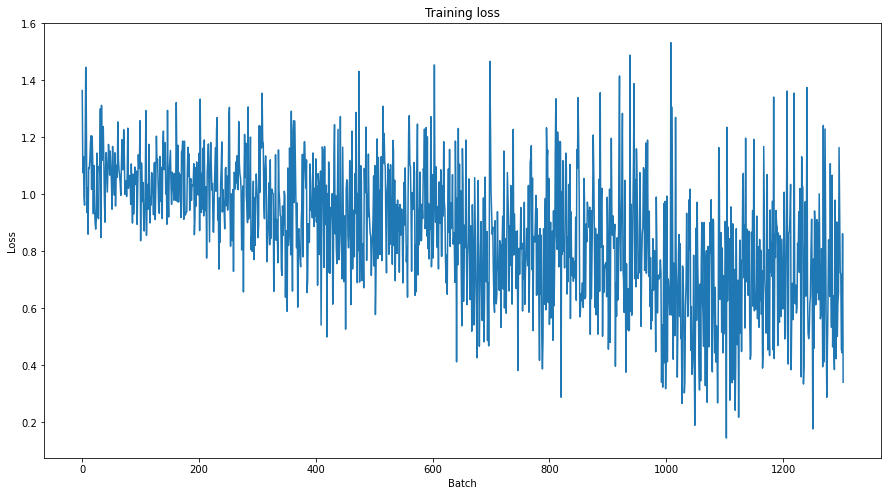

In [ ]:
plt.figure(figsize=(15,8))
plt.title("Training loss")
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.plot(train_loss_set)
plt.show()

##Predict and Evaluate on Test Set

In [ ]:
#Evaluation on Test dataset
# Evaluate data for one epoch
model.eval()
for batch in test_dataloader:
  # Add batch to GPU
  batch = tuple(t.to(device) for t in batch)
  #batch = tuple(t for t in batch)
  # Unpack the inputs from our dataloader
  b_input_ids, b_input_mask, b_input_seg_mask, b_labels = batch
  # Telling the model not to compute or store gradients, saving memory and speeding up validation
  with torch.no_grad():
    # Forward pass, calculate logit predictions
    logits = model(b_input_ids.long(), token_type_ids=b_input_seg_mask, attention_mask=b_input_mask)[0]
  
  # Move logits and labels to CPU
  logits = logits.detach().cpu().numpy()
  label_ids = b_labels.to('cpu').numpy()

  tmp_eval_accuracy = flat_accuracy(logits, label_ids)
  
  eval_accuracy += tmp_eval_accuracy
  nb_eval_steps += 1

print("Test Accuracy: {}".format(eval_accuracy/nb_eval_steps))

Test Accuracy: 0.5169642857142858


#Test Dataset Visualizations

In [ ]:
for batch in test_dataloader:
    # Add batch to GPU
    batch = tuple(t.to(device) for t in batch)
    #batch = tuple(t for t in batch)
    # Unpack the inputs from our dataloader
    b_input_ids, b_input_mask, b_input_seg_mask, b_labels = batch
    # Telling the model not to compute or store gradients, saving memory and speeding up validation
    outputs = model(b_input_ids.long(), token_type_ids=b_input_seg_mask, attention_mask=b_input_mask, output_hidden_states=True, output_attentions=True)

In [ ]:
outputs = model(b_input_ids[0].long().reshape(1,-1), token_type_ids=b_input_seg_mask[0].reshape(1,-1), attention_mask=b_input_mask[0].reshape(1,-1), output_hidden_states=True, output_attentions=True)

In [ ]:
outputs.keys()

odict_keys(['logits', 'hidden_states', 'attentions'])

In [ ]:
outputs['attentions'][-1].shape

torch.Size([1, 12, 256, 256])

In [ ]:
xx  = torch.stack(list(outputs['attentions']), dim=0)
print(xx.shape)

torch.Size([12, 1, 12, 256, 256])


In [ ]:
xx[:,0,:,:,:].shape

torch.Size([12, 12, 256, 256])

In [ ]:
len(outputs['attentions'])

12

#bertviz Visualisation
for one argument pair, we need to pass it to the model by making the
output_hidden states and output_attention = TRUE, then using bertviz we need to visulaise all the layers 

In [ ]:
!pip install bertviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 KB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.7/132.7 KB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 68.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 KB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 115.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 16.6 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


# Model View Visualization

In [ ]:
from transformers import AutoTokenizer, AutoModel, utils
from bertviz import model_view
utils.logging.set_verbosity_error()  # Suppress standard warnings

attention = xx[:,:,:,0:30,0:30]  # Retrieve attention from model outputs
tokens = tokenizer.convert_ids_to_tokens(b_input_ids[0][0:30])  # Convert input ids to token strings
model_view(attention, tokens)  # Display model view

<IPython.core.display.Javascript object>

# Attention Head View Visualization

In [ ]:
from bertviz import head_view
head_view(attention, tokens)

<IPython.core.display.Javascript object>